# Прогнозирование оттока клиентов в сети отелей «Как в гостях»

#### О проекте. ####

Сеть отелей добавила на свой сайт возможность забронировать номер без предоплаты. Однако если клиент отменял бронирование, то компания терпела убытки. Сотрудники отеля могли, например, закупить продукты к приезду гостя или просто не успеть найти другого клиента.
Чтобы решить эту проблему, вам нужно разработать систему, которая предсказывает отказ от брони. Если модель покажет, что бронь будет отменена, то клиенту предлагается внести депозит. Размер депозита — 80% от стоимости номера за одни сутки и затрат на разовую уборку. Деньги будут списаны со счёта клиента, если он всё же отменит бронь.

#### Цель. ####

- Разработать систему, которая предсказывает отказ от брони.

#### План. ####

- Предобработка и исследовательский анализ данных.
- Вычислить бизнес-метрику.
- Разработать модель ML.
- Выявить признаки «ненадёжного» клиента.
- Написать общий вывод.

### Шаг 1. Откройте файлы с данными

In [1]:
import pandas as pd
import math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler 
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score, accuracy_score, recall_score
from sklearn.metrics import roc_curve 
from sklearn.impute import SimpleImputer
from sklearn.utils import shuffle
from sklearn.model_selection import cross_val_score
import numpy as np
import warnings

In [2]:
warnings.filterwarnings('ignore')

In [3]:
train_data = pd.read_csv("/datasets/hotel_train.csv")
test_data = pd.read_csv("/datasets/hotel_test.csv")

In [4]:
train_data.info()
train_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65229 entries, 0 to 65228
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              65229 non-null  int64  
 1   is_canceled                     65229 non-null  int64  
 2   lead_time                       65229 non-null  float64
 3   arrival_date_year               65229 non-null  int64  
 4   arrival_date_month              65229 non-null  object 
 5   arrival_date_week_number        65229 non-null  int64  
 6   arrival_date_day_of_month       65229 non-null  int64  
 7   stays_in_weekend_nights         65229 non-null  int64  
 8   stays_in_week_nights            65229 non-null  int64  
 9   adults                          65229 non-null  float64
 10  children                        65229 non-null  float64
 11  babies                          65229 non-null  float64
 12  meal                            

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights
0,0,0,7.0,2015,July,27,1,0,1,1.0,...,0,0,0,A,0,0,Transient,0,0,1
1,1,0,14.0,2015,July,27,1,0,2,2.0,...,0,0,0,A,0,0,Transient,0,1,2
2,2,0,0.0,2015,July,27,1,0,2,2.0,...,0,0,0,C,0,0,Transient,0,0,2
3,3,0,9.0,2015,July,27,1,0,2,2.0,...,0,0,0,C,0,0,Transient,0,1,2
4,4,1,85.0,2015,July,27,1,0,3,2.0,...,0,0,0,A,0,0,Transient,0,1,3


In [5]:
train_data.describe()

,id,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests,total_nights
count,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000,65229.000000
mean,43544.069172,0.368609,96.337917,2015.719021,31.339772,15.847813,0.825185,2.224793,1.836576,0.074890,0.007236,0.027151,0.128915,0.107713,0.194269,3.334422,0.056647,0.512763,3.049978
std,25614.858971,0.482431,96.127545,0.449481,13.464024,8.748182,0.853477,1.354992,0.480245,0.334243,0.098790,0.162523,0.965326,1.326638,0.593838,18.239606,0.232094,0.752590,1.738108
min,0.000000,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,19108.000000,0.000000,17.000000,2015.000000,21.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,40554.000000,0.000000,64.000000,2016.000000,34.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
75%,67414.000000,1.000000,151.000000,2016.000000,42.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000
max,84121.000000,1.000000,374.000000,2016.000000,53.000000,31.000000,4.000000,6.000000,4.000000,3.000000,10.000000,1.000000,26.000000,58.000000,17.000000,259.000000,3.000000,5.000000,10.000000


In [6]:
test_data.info()
test_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32412 entries, 0 to 32411
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              32412 non-null  int64  
 1   is_canceled                     32412 non-null  int64  
 2   lead_time                       32412 non-null  float64
 3   arrival_date_year               32412 non-null  int64  
 4   arrival_date_month              32412 non-null  object 
 5   arrival_date_week_number        32412 non-null  int64  
 6   arrival_date_day_of_month       32412 non-null  int64  
 7   stays_in_weekend_nights         32412 non-null  int64  
 8   stays_in_week_nights            32412 non-null  int64  
 9   adults                          32412 non-null  float64
 10  children                        32412 non-null  float64
 11  babies                          32412 non-null  float64
 12  meal                            

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights
0,6086,1,74.0,2017,January,1,1,1,0,2.0,...,0,0,0,A,0,0,Transient,0,0,1
1,6087,1,62.0,2017,January,1,1,2,2,2.0,...,0,0,0,A,0,0,Transient,0,1,4
2,6088,1,62.0,2017,January,1,1,2,2,2.0,...,0,0,0,A,0,0,Transient,0,1,4
3,6089,1,71.0,2017,January,1,1,2,2,1.0,...,0,0,0,A,0,0,Transient,0,1,4
4,6090,1,172.0,2017,January,1,1,2,5,2.0,...,0,0,0,A,0,0,Transient,0,0,7


In [7]:
test_data.describe()

,id,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests,total_nights
count,32412.000000,32412.000000,32412.000000,32412.0,32412.000000,32412.000000,32412.000000,32412.00000,32412.000000,32412.000000,32412.000000,32412.000000,32412.000000,32412.000000,32412.000000,32412.000000,32412.000000,32412.000000,32412.000000
mean,60131.505183,0.388467,97.587869,2017.0,17.804054,15.656948,0.867888,2.34009,1.858602,0.083765,0.005523,0.031377,0.011601,0.171418,0.216741,0.262341,0.046248,0.657781,3.207979
std,29953.586177,0.487409,86.507146,0.0,9.177384,8.766429,0.853394,1.37517,0.489341,0.343470,0.075757,0.174338,0.180473,1.875170,0.640551,4.733027,0.219367,0.834341,1.738683
min,6086.000000,0.000000,0.000000,2017.0,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,45291.750000,0.000000,23.000000,2017.0,10.000000,8.000000,0.000000,1.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,53394.500000,0.000000,76.000000,2017.0,18.000000,15.500000,1.000000,2.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
75%,89800.250000,1.000000,155.000000,2017.0,25.000000,23.000000,2.000000,3.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000
max,97903.000000,1.000000,373.000000,2017.0,35.000000,31.000000,4.000000,6.00000,4.000000,3.000000,2.000000,1.000000,6.000000,72.000000,18.000000,223.000000,8.000000,5.000000,10.000000


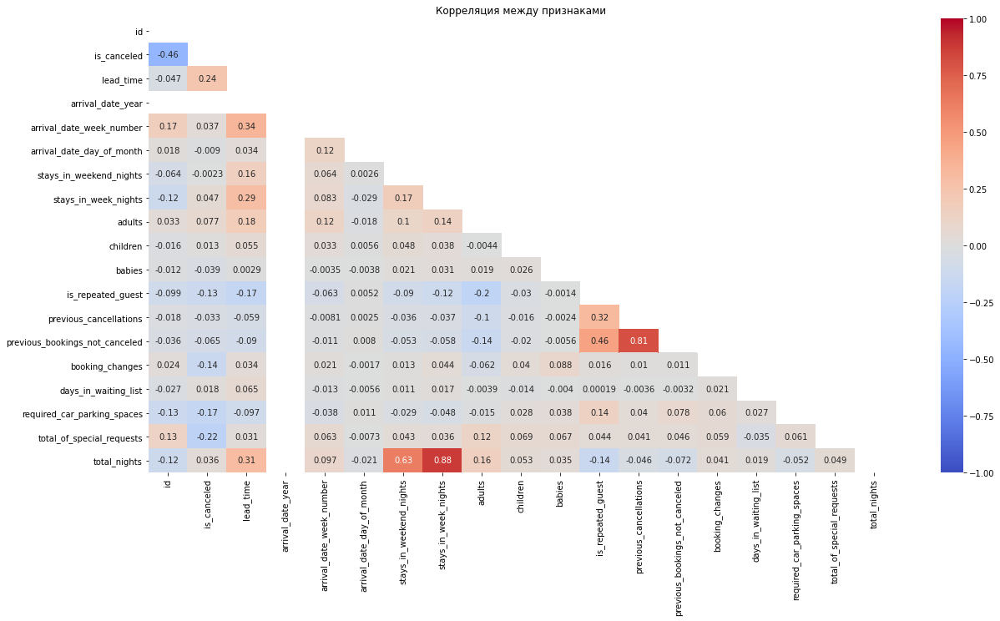

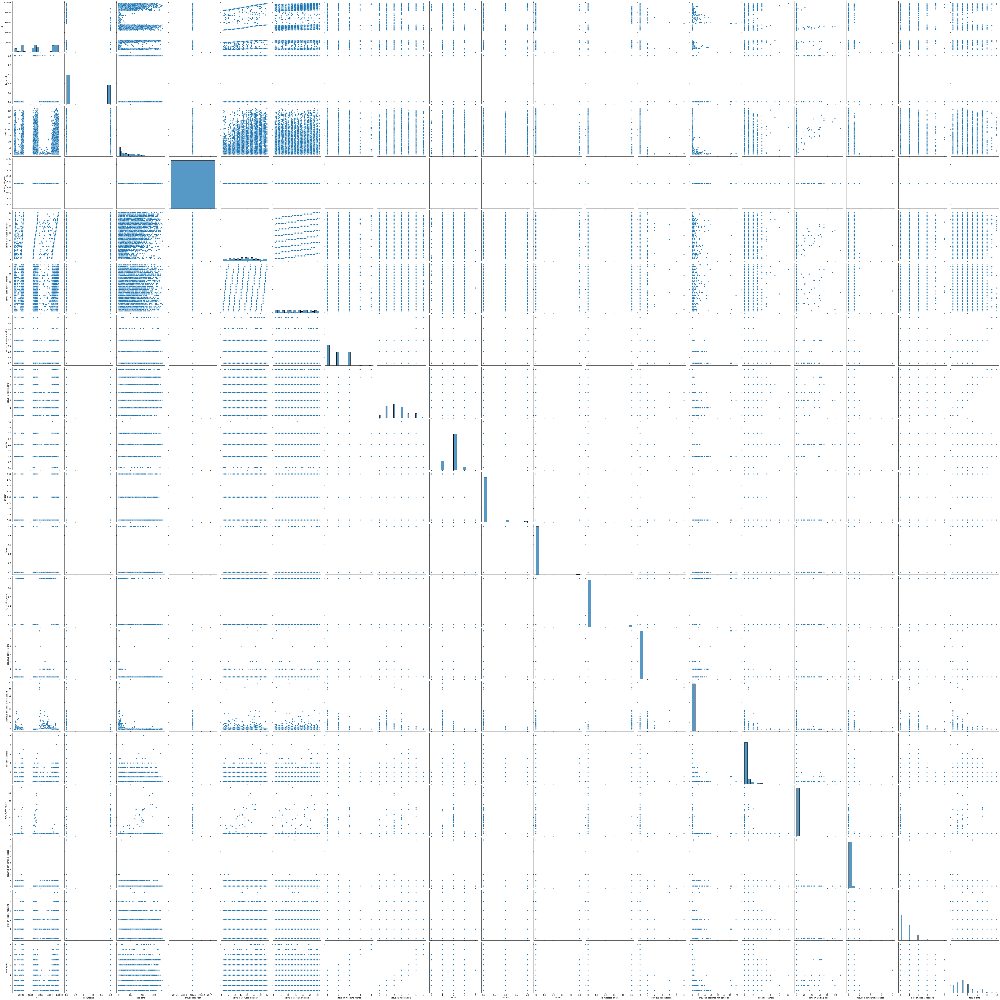

In [8]:
def show_corr(data):

    plt.figure(figsize = (20, 10))
    plt.title('Корреляция между признаками')
    sns.heatmap(data.corr(), annot=True, mask=np.triu(data.corr()), 
                cmap='coolwarm', vmin=-1, vmax=1, center= 0);

    sns.pairplot(data.sample(frac = 0.2, random_state = 42), height = 4);
    
show_corr(test_data)

#### Вывод ####

Данные осмотрены, пропуски отсутсвуют. Теперь можем перейти к предобработке и исследованию.



### Шаг 2. Предобработка и исследовательский анализ данных

**Проверим на наличе дубликатов**

In [9]:
print('Количество дубликатов в тренировочном датасете',train_data.duplicated().sum())
print('Количество дубликатов в тестовом датасете', test_data.duplicated().sum())


Количество дубликатов в тренировочном датасете 0
Количество дубликатов в тестовом датасете 0


In [10]:
print(train_data["id"].nunique())
print(test_data["id"].nunique())


65229
32412


**Дубликатов нет, пропусков также нет тк ранее мы вывели краткое описание каждого датафрейма.**

**Преобразуем столбец с месяцами в числовой формат:**

In [11]:
train_data['arrival_date_month'] = pd.to_datetime(train_data['arrival_date_month'], format='%B')
train_data['arrival_date_month'] = pd.DatetimeIndex(train_data['arrival_date_month']).month 
test_data['arrival_date_month'] = pd.to_datetime(test_data['arrival_date_month'], format='%B')
test_data['arrival_date_month'] = pd.DatetimeIndex(test_data['arrival_date_month']).month 
train_data['arrival_date_month'].unique()


array([ 7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6])

In [12]:
print(train_data['arrival_date_year'].unique())
print(test_data['arrival_date_year'].unique())
print(train_data['arrival_date_month'].unique())
print(test_data['arrival_date_month'].unique())
print(train_data['reserved_room_type'].unique())
print(train_data['country'].unique())

[2015 2016]
[2017]
[ 7  8  9 10 11 12  1  2  3  4  5  6]
[1 2 3 4 5 6 7 8]
['A               ' 'C               ' 'D               '
 'E               ' 'G               ' 'F               '
 'B               ']
['GBR' 'PRT' 'ESP' 'IRL' 'FRA' 'ROU' 'NOR' 'USA' 'DEU' 'BEL' 'CHE' 'CN'
 'GRC' 'NLD' 'ARG' 'RUS' 'SWE' 'POL' 'EST' 'CZE' 'ITA' 'FIN' 'DNK' 'MOZ'
 'BWA' 'LUX' 'BRA' 'SVN' 'ALB' 'CHN' 'MEX' 'MAR' 'SMR' 'LVA' 'CHL' 'AUT'
 'LTU' 'TUR' 'ISR' 'IND' 'CYM' 'AUS' 'CPV' 'ZWE' 'DZA' 'KOR' 'CRI' 'HUN'
 'TUN' 'ARE' 'HRV' 'HKG' 'IRN' 'GIB' 'JEY' 'URY' 'ZAF' 'COL' 'GGY' 'KWT'
 'CYP' 'KAZ' 'THA' 'DOM' 'NGA' 'BLR' 'VEN' 'UKR' 'ARM' 'JPN' 'LKA' 'MYS'
 'BIH' 'MUS' 'OMN' 'SUR' 'JAM' 'BGR' 'CIV' 'SRB' 'JOR' 'SYR' 'PHL' 'PRI'
 'SGP' 'BDI' 'LBN' 'AGO' 'VNM' 'AZE' 'PLW' 'NZL' 'EGY' 'MDV' 'CMR' 'MLT'
 'SVK' 'MWI' 'STP' 'TWN' 'IDN' 'SEN' 'PER' 'SAU' 'KNA' 'ETH' 'ECU' 'IRQ'
 'AND' 'HND' 'PAK' 'GEO' 'ZMB' 'QAT' 'KHM' 'MCO' 'BGD' 'ISL' 'UZB' 'IMN'
 'TJK' 'NIC' 'BEN' 'MAC' 'VGB' 'TZA' 'GAB' 'MKD' 'TMP' 'GLP

**Приведем данные в нормальный вид**

In [13]:
train_data['reserved_room_type'] = train_data['reserved_room_type'].str.strip() 
test_data['reserved_room_type'] = test_data['reserved_room_type'].str.strip() 
train_data['reserved_room_type'].unique()

array(['A', 'C', 'D', 'E', 'G', 'F', 'B'], dtype=object)

**Исследование задачи**

Посмотрим соотношение целового признака (сколько отказываются от брони, а сколько нет)

In [14]:
temp = train_data['is_canceled'].value_counts(normalize=True)
print(temp)
fig = px.bar(temp, title="Соотношение целевого признака.",
             labels={"value": "Процент",
                     "index": "Бронь клиентов"})
fig.show()

0    0.631391
1    0.368609
Name: is_canceled, dtype: float64


**Соотношение отменивших бронь клиентов:**

In [15]:
print(temp[1]/temp[0])


0.5838047832948888


**Исследуем колонку `arrival_date_week_number`.**


In [16]:
fig = px.histogram(train_data, x="arrival_date_week_number", color="is_canceled",
                   title="Тренировочный датафрейм.",
                   labels={"count": "Количество",
                          "arrival_date_week_number": "Распределения бронирования номеров по неделям"})
fig.show()

In [17]:
fig = px.histogram(test_data, x="arrival_date_week_number", color="is_canceled",
                   title="Тестовый датафрейм.",
                   labels={"count": "Количество",
                          "arrival_date_week_number": "Распределения бронирования номеров по неделям"})
fig.show()

- В обучающей выборке наиболее популярные недели с 38 по 42.
- В тренировочной выборке наиболее популярные с 15 по 18.

**Исследуем колонку `arrival_date_day_of_month`.**


In [18]:
fig = px.histogram(train_data, x="arrival_date_day_of_month", color="is_canceled",
                   title="Тренировочный датафрейм.",
                   labels={"count": "Количество",
                          "arrival_date_day_of_month": "Распределения бронирования номеров по дням"})
fig.show()

In [19]:
fig = px.histogram(test_data, x="arrival_date_day_of_month", color="is_canceled",
                   title="Тестовый датафрейм.",
                   labels={"count": "Количество",
                          "arrival_date_day_of_month": "Распределения бронирования номеров по неделям"})
fig.show()

- Интерсная особенность обоих графиков, что наименьшее число бронирований 31, вполне возможно из-за того, что в не каждом месяце есть 31 число.

**Исследуем колонку `is_repeated_guest`.**


In [20]:
fig = px.histogram(train_data, y="is_repeated_guest", color="is_canceled",
                   title="Тренировочный датафрейм.",
                   labels={"count": "Количество",
                          "is_repeated_guest": "Количество повторных бронирований"})
fig.show()

In [21]:
fig = px.histogram(test_data, y="is_repeated_guest", color="is_canceled",
                   title="Тестовый датафрейм.",
                   labels={"count": "Количество",
                          "is_repeated_guest": "Количество повторных бронирований"})
fig.show()

- Еще один интересный факт можем выяснить исходя из графика, несмотря на повторное бронирование, клиент все также может отменить, тем самым отель потеряет деньги. Поэтому не стоит слепо верить повторному бронированию.

**Выбросы.**

В тренировочной выборке можно заметить столбец `babies`, в котором максимальное значение ***10***, что очень похоже на выброс. Проверим этот столбец.

In [22]:
train_data['babies'].value_counts()

0.0     64777
1.0       447
2.0         3
9.0         1
10.0        1
Name: babies, dtype: int64

Всего 2 таких выброса, от них можно избавиться.

In [23]:
train_data = train_data[train_data['babies'] < 9]

Так же посмотрим были ли записи, в которых вообще не было указано кол-во человек.

In [24]:
train_data[(train_data['adults'] == 0) & (train_data['babies'] == 0) & (train_data['children'] == 0)]

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights
23770,31710,0,48.0,2016,2,9,21,2,4,0.0,...,0,0,0,B,2,0,Transient-Party,0,0,6
26878,34818,0,122.0,2016,5,19,5,2,4,0.0,...,0,0,0,E,3,0,Transient,0,0,6
26879,34819,0,122.0,2016,5,19,5,2,4,0.0,...,0,0,0,E,3,0,Transient,0,0,6
31570,39510,0,256.0,2016,8,35,21,3,5,0.0,...,0,0,0,A,1,0,Transient,0,0,8
41461,59858,0,0.0,2015,11,49,30,1,2,0.0,...,1,0,1,A,2,0,Transient,0,0,3
50744,69262,0,52.0,2016,4,18,30,2,4,0.0,...,0,0,0,E,2,0,Transient-Party,0,1,6
54881,73467,0,108.0,2016,7,28,5,2,5,0.0,...,0,0,0,A,0,0,Transient,0,0,7
56674,75308,0,4.0,2016,8,32,5,2,2,0.0,...,0,0,0,A,2,0,Transient,0,2,4
57390,76028,0,88.0,2016,8,34,16,0,4,0.0,...,0,0,0,D,5,0,Transient,0,2,4
58416,77078,0,36.0,2016,8,35,27,3,6,0.0,...,0,0,0,A,2,0,Transient,0,2,9


Таких фантомных записей обнаружено 15, от них тоже можем избавиться.

In [25]:
train_data = train_data[~((train_data['adults'] == 0) & (train_data['babies'] == 0) \
                          & (train_data['children'] == 0))]
                          
                          

**Вывод.**

- Тренировочная выборка избавилась от 17 выбросов. 

#### Вывод ####

- С данными все в порядке.
- Не отменившие бронь клиентов – 63%
- Отменивших бронь клиентов – 37%
- В обучающей выборке наиболее популярные недели с 38 по 42.
- В тренировочной выборке наиболее популярные с 15 по 18.
- Наименьшее число бронирований 31 числа
- Не стоит слепо верить повторному бронированию.
- Тренировочная выборка избавилась от 17 выбросов. 

### Шаг 3. Формулировка ML-задачи на основе бизнес-задачи

Посчитаем прибыль каждой категории:
категория A: за ночь — 1 000, разовое обслуживание — 400;
категория B: за ночь — 800, разовое обслуживание — 350;
категория C: за ночь — 600, разовое обслуживание — 350;
категория D: за ночь — 550, разовое обслуживание — 150;
категория E: за ночь — 500, разовое обслуживание — 150;
категория F: за ночь — 450, разовое обслуживание — 150;
категория G: за ночь — 350, разовое обслуживание — 150.

In [26]:
BUDGET_FORECAST = 400000
SUMMER_COEF = 0.4
SPRING_FALL_COEF = 0.2
SUMMER = [6, 7, 8]
SPRING_FALL = [9, 10, 11 , 3, 4, 5]
A_PRICE = 1000
A_SERVICE = 400
B_PRICE = 800
B_SERVICE = 350
C_PRICE = 600
C_SERVICE = 350
D_PRICE = 550
D_SERVICE = 150
E_PRICE = 500
E_SERVICE = 150
F_PRICE = 450
F_SERVICE = 150
G_PRICE = 350
G_SERVICE = 150

**Создадим сводную таблицу и потом склееим с основными датафреймами.**

In [27]:
prices = {'reserved_room_type' : ['A','B', 'C', 'D', 'E', 'F', 'G'],
          'price': [A_PRICE, B_PRICE, C_PRICE, D_PRICE, E_PRICE, F_PRICE, G_PRICE],
          'service' : [A_SERVICE, B_SERVICE, C_SERVICE, D_SERVICE, E_SERVICE, F_SERVICE, G_SERVICE]}
prices = pd.DataFrame(prices)
prices


,reserved_room_type,price,service
0,A,1000,400
1,B,800,350
2,C,600,350
3,D,550,150
4,E,500,150
5,F,450,150
6,G,350,150


In [28]:
train_data = train_data.merge(prices, on='reserved_room_type', how='left')
test_data = test_data.merge(prices, on='reserved_room_type', how='left')

In [29]:
def coefficient(row):
    month = row['arrival_date_month']
    if month in SUMMER:
        return SUMMER_COEF
    elif month in SPRING_FALL:
        return SPRING_FALL_COEF
    else:
        return 0
     

In [30]:
train_data['coefficient'] = train_data.apply(coefficient, axis=1)
test_data['coefficient'] = test_data.apply(coefficient, axis=1)
train_data.sample(10)

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights,price,service,coefficient
64992,83740,0,119.0,2016,12,53,28,0,3,2.0,...,E,2,0,Transient,0,1,3,500,150,0.0
62667,81381,0,75.0,2016,11,46,6,2,2,1.0,...,D,0,0,Transient,0,3,4,550,150,0.2
28354,36298,1,30.0,2016,6,23,2,0,2,2.0,...,A,0,0,Transient,0,0,2,1000,400,0.4
5997,6074,1,72.0,2016,12,53,30,1,2,2.0,...,E,0,0,Transient,0,0,3,500,150,0.0
687,695,0,13.0,2015,8,34,18,0,1,2.0,...,A,0,0,Transient,0,0,1,1000,400,0.4
29769,37713,1,155.0,2016,6,27,27,1,2,2.0,...,A,0,0,Transient,0,0,3,1000,400,0.4
40356,58734,0,19.0,2015,10,41,6,0,3,2.0,...,A,0,0,Transient-Party,0,0,3,1000,400,0.2
17779,25719,0,39.0,2015,8,33,14,0,2,2.0,...,A,0,0,Transient-Party,0,0,2,1000,400,0.4
11390,13978,0,69.0,2016,3,13,25,2,5,2.0,...,F,0,0,Transient,0,0,7,450,150,0.2
26670,34612,0,118.0,2016,5,19,1,2,3,2.0,...,D,0,0,Transient-Party,0,0,5,550,150,0.2


In [31]:
def profit(price, service, days, coefficient):
    result = (days * price * (coefficient+1)) -  (1 + math.floor(days)//2) * service 
    return result

def unprofit(price, service, coefficient):
    result = 0 - (price * (coefficient+1) + service)  
    return result

def deposit(price, service, coefficient):  
    result = (price * (coefficient+1)) *0.8 + service
    return result

In [32]:
def before_deposit(row):
    room_type = row['reserved_room_type']  
    coefficient = row['coefficient']                     
    days = row['total_nights']             
    cancel = row['is_canceled']
    price = row['price']
    service = row['service']
    if cancel == 0:
        return profit(price, service, days, coefficient)
    else:
        return unprofit(price, service, coefficient) 

In [33]:
train_data['income_before'] = train_data.apply(before_deposit, axis=1)
test_data['income_before'] = test_data.apply(before_deposit, axis=1)
train_data.query("is_canceled == 0")['income_before'].sort_values()
train_data

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights,price,service,coefficient,income_before
0,0,0,7.0,2015,7,27,1,0,1,1.0,...,0,0,Transient,0,0,1,1000,400,0.4,1000.0
1,1,0,14.0,2015,7,27,1,0,2,2.0,...,0,0,Transient,0,1,2,1000,400,0.4,2000.0
2,2,0,0.0,2015,7,27,1,0,2,2.0,...,0,0,Transient,0,0,2,600,350,0.4,980.0
3,3,0,9.0,2015,7,27,1,0,2,2.0,...,0,0,Transient,0,1,2,600,350,0.4,980.0
4,4,1,85.0,2015,7,27,1,0,3,2.0,...,0,0,Transient,0,1,3,1000,400,0.4,-1800.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65207,84057,0,23.0,2016,12,53,30,2,4,2.0,...,0,0,Transient,0,2,6,550,150,0.0,2700.0
65208,84063,0,53.0,2016,12,53,31,2,3,2.0,...,0,0,Transient,0,3,5,550,150,0.0,2300.0
65209,84094,0,7.0,2016,12,53,31,2,4,2.0,...,0,0,Transient,0,1,6,550,150,0.0,2700.0
65210,84117,0,17.0,2016,12,53,30,2,5,2.0,...,0,0,Transient,0,1,7,1000,400,0.0,5400.0


**Прибыль отеля без внедрения депозитов:**

In [34]:
income_before = test_data['income_before'].sum() / 8 * 12
print('Количество месяцев:',len(test_data["arrival_date_month"].unique()))
print('Прибыль без депозитов:', income_before)

Количество месяцев: 8
Прибыль без депозитов: 48874380.0


#### Вывод ####

Таким образом Прибыль отеля без внедрения депозитов составила `48874380.0 Руб.`

### Шаг 4. Разработка модели ML

Мультиколлинеарность негативно влияет на модели и такие колонки как `id`, `country` не будут влиять на результат, тк не содержат полезной информации. Поэтому удаляем их, а также создадим фиктивные переменные для строковых переменных:

In [35]:
train_data = train_data.drop(['id', 'country', 'total_nights', 'previous_bookings_not_canceled', 'arrival_date_year'], axis=1)
test_data = test_data.drop(['id', 'country', 'total_nights', 'previous_bookings_not_canceled', 'arrival_date_year'], axis=1)
train_data = pd.get_dummies(train_data, drop_first=True)
test_data = pd.get_dummies(test_data, drop_first=True)
train_data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 65212 entries, 0 to 65211
Data columns (total 36 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   is_canceled                    65212 non-null  int64  
 1   lead_time                      65212 non-null  float64
 2   arrival_date_month             65212 non-null  int64  
 3   arrival_date_week_number       65212 non-null  int64  
 4   arrival_date_day_of_month      65212 non-null  int64  
 5   stays_in_weekend_nights        65212 non-null  int64  
 6   stays_in_week_nights           65212 non-null  int64  
 7   adults                         65212 non-null  float64
 8   children                       65212 non-null  float64
 9   babies                         65212 non-null  float64
 10  is_repeated_guest              65212 non-null  int64  
 11  previous_cancellations         65212 non-null  int64  
 12  booking_changes                65212 non-null 

In [36]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32412 entries, 0 to 32411
Data columns (total 36 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   is_canceled                    32412 non-null  int64  
 1   lead_time                      32412 non-null  float64
 2   arrival_date_month             32412 non-null  int64  
 3   arrival_date_week_number       32412 non-null  int64  
 4   arrival_date_day_of_month      32412 non-null  int64  
 5   stays_in_weekend_nights        32412 non-null  int64  
 6   stays_in_week_nights           32412 non-null  int64  
 7   adults                         32412 non-null  float64
 8   children                       32412 non-null  float64
 9   babies                         32412 non-null  float64
 10  is_repeated_guest              32412 non-null  int64  
 11  previous_cancellations         32412 non-null  int64  
 12  booking_changes                32412 non-null 

**Разделим на признаки и на целевой признак каждую выборку.**

За метрику возьмем ***recall***,  так как чем выше, тем меньше ложно отрицательных срабатываний. А чем меньше ложно отрицательных срабатываний, тем меньше ошибок предсказания клиента как не отменяющего, когда на самом деле он отменил бронь (то есть принес убытки).

In [37]:
features_train = train_data.drop(['is_canceled', 'price', 'service', 'coefficient', 'income_before'], axis=1)
target_train = train_data['is_canceled']
features_test = test_data.drop(['is_canceled', 'price', 'service', 'coefficient', 'income_before'], axis=1)
target_test = test_data['is_canceled']

**Проведем стандартизацию.**

In [38]:
num = ['lead_time', 'adults', 'children', 'booking_changes', 'babies', 'is_repeated_guest', 
       'days_in_waiting_list', 'previous_cancellations','stays_in_weekend_nights', 'stays_in_week_nights',
       'total_of_special_requests', 'arrival_date_day_of_month',
      'arrival_date_month', 'arrival_date_week_number', 'required_car_parking_spaces'] 

scaler = StandardScaler()
scaler.fit(train_data[num])

train_data[num] = pd.DataFrame(scaler.transform(train_data[num]))
test_data[num] = pd.DataFrame(scaler.transform(test_data[num]))

**Логистическая регрессия**

In [39]:
model_lr = LogisticRegression(random_state=12345, solver='liblinear', max_iter=13)
scores_train = cross_val_score(model_lr, features_train, target_train, cv=5, scoring='recall')
print('Средняя оценка качества модели на обучающей выборке:', scores_train.mean())

Средняя оценка качества модели на обучающей выборке: 0.4734280635068259


In [40]:
lr_best_model = None
lr_best_precision = 0
lr_best_max_iter = 0
lr_best_accuracy = 0
lr_best_f1 = 0
lr_best_recall = 0
lr_best_predictions = 0
for max_iter in range(1, 51):
    model = LogisticRegression(random_state=12345, solver='liblinear', max_iter=max_iter)
    model.fit(features_train, target_train) 
    model_predictions = model.predict(features_train) 
    precision = precision_score(target_train, model_predictions)
    recall = recall_score(target_train, model_predictions)
    accuracy = accuracy_score(target_train, model_predictions)
    f1 = f1_score(target_train, model_predictions)
    if recall > lr_best_recall:
        lr_best_model = model
        lr_best_recall = recall
        lr_best_precision = precision
        lr_best_max_iter = max_iter
        lr_best_accuracy = accuracy
        lr_best_f1 = f1
        lr_best_predictions = model_predictions
                
print("Лучшее количество итераций:", lr_best_max_iter)
print('Положительная доля модели:', lr_best_recall)
print("Точность лучшей модели:", lr_best_precision)
print('Доля правильных ответов:', lr_best_accuracy) 
print('F1-мера:', lr_best_f1)

Лучшее количество итераций: 13
Положительная доля модели: 0.5924139078356346
Точность лучшей модели: 0.7787862219792236
Доля правильных ответов: 0.787677114641477
F1-мера: 0.6729342844994567


**Модель дерево решений.**

In [41]:
tr_best_model = None
tr_best_precision = 0
tr_best_depth = 0
tr_best_accuracy = 0
tr_best_f1 = 0
tr_best_recall = 0
tr_best_predictions = 0
for depth in range(1, 51):
    model = DecisionTreeClassifier(random_state=12345, max_depth=depth)
    model.fit(features_train, target_train)
    model_predictions = model.predict(features_train) 
    recall = recall_score(target_train, model_predictions)
    precision = precision_score(target_train, model_predictions)
    accuracy = accuracy_score(target_train, model_predictions)
    f1 = f1_score(target_train, model_predictions)
    if recall > tr_best_recall:
        tr_best_model = model
        tr_best_recall = recall
        tr_best_precision = precision
        tr_best_depth = depth
        tr_best_accuracy = accuracy
        tr_best_f1 = f1
        tr_best_predictions = model_predictions

        
print('Глубина дерева:', tr_best_depth)
print('Положительная доля модели:', tr_best_recall)
print("Точность лучшей модели:", tr_best_precision)
print('Доля правильных ответов:', tr_best_accuracy) 
print('f1 лучшей модели:', tr_best_f1)

Глубина дерева: 42
Положительная доля модели: 0.970346032274164
Точность лучшей модели: 0.9811598469237562
Доля правильных ответов: 0.9821965282463351
f1 лучшей модели: 0.9757229784831567


In [42]:
model_tr = DecisionTreeClassifier(random_state=12345, max_depth=42)
scores_train = cross_val_score(model_tr, features_train, target_train, cv=5, scoring='recall')
print('Средняя оценка качества модели на обучающей выборке:', scores_train.mean())

Средняя оценка качества модели на обучающей выборке: 0.38329096615504277


**Модель случайного леса.**

In [43]:
rf_best_model = None
rf_best_precision = 0
rf_best_est = 0
rf_best_depth = 0
rf_best_accuracy = 0
rf_best_f1 = 0
rf_best_recall = 0
rf_best_predictions = 0

for est in range(1, 51, 5):
    for depth in range(3, 21):
        model = RandomForestClassifier(random_state=12345, n_estimators=est, max_depth=depth)
        model.fit(features_train, target_train) 
        model_predictions = model.predict(features_train)
        recall = recall_score(target_train, model_predictions)
        precision = precision_score(target_train, model_predictions)
        accuracy = accuracy_score(target_train, model_predictions)
        f1 = f1_score(target_train, model_predictions)
        if recall > rf_best_recall:
            rf_best_model = model
            rf_best_recall = recall
            rf_best_precision = precision
            rf_best_est = est
            rf_best_depth = depth
            rf_best_accuracy = accuracy
            rf_best_f1 = f1
            rf_best_predictions = model_predictions
            
            
print("Наилучшее количество деревьев:", rf_best_est)
print('Положительная доля модели:', rf_best_recall)
print("Наилучшая глубина", rf_best_depth)
print("Точность лучшей модели:", rf_best_precision)
print('Доля правильных ответов:', rf_best_accuracy) 
print('F1-мера:', rf_best_f1)

Наилучшее количество деревьев: 46
Положительная доля модели: 0.8166278489436034
Наилучшая глубина 20
Точность лучшей модели: 0.9146597102529463
Доля правильных ответов: 0.9042967551984298
F1-мера: 0.8628683175496034


In [44]:
model_rf = RandomForestClassifier(random_state=12345, n_estimators=46, max_depth=20)
scores_train = cross_val_score(model_rf, features_train, target_train, cv=5, scoring='recall')
print('Средняя оценка качества модели на обучающей выборке:', scores_train.mean())

Средняя оценка качества модели на обучающей выборке: 0.3421585947590641


**Лучшая модель:**

- Логистическая регрессия
    - Средняя оценка качества модели на обучающей выборке: 0.47
    - Лучшее количество итераций: 13
    - Положительная доля модели: 0.5924139078356346
    - Точность лучшей модели: 0.7787862219792236
    - Доля правильных ответов: 0.787677114641477
    - F1-мера: 0.6729342844994567

**Тестирование лучшей модели**

In [45]:
predicted_test = lr_best_model.predict(features_test)
recall = recall_score(target_test, predicted_test)
precision = precision_score(target_test, predicted_test)
accuracy = accuracy_score(target_test, predicted_test)
f1 = f1_score(target_test, predicted_test)
print('Положительная доля модели:', recall)
print("Точность лучшей модели:", lr_best_precision)
print('Доля правильных ответов:', lr_best_accuracy) 
print('F1-мера:', lr_best_f1)

Положительная доля модели: 0.5052021285044873
Точность лучшей модели: 0.7787862219792236
Доля правильных ответов: 0.787677114641477
F1-мера: 0.6729342844994567


**Оценка прибыли**

In [46]:
def after_deposit(row):
    coefficient = row['coefficient']                     
    days = row['stays_in_weekend_nights'] + row['stays_in_week_nights'] 
    cancel = row['is_canceled']
    price = row['price']
    service = row['service']
    predictions = row['predictions']
    income = row["income_before"]
    if cancel == 0 and predictions == 0:
        return income 
    elif cancel == 0 and predictions == 1:
        return income
    elif cancel == 1 and predictions == 0:
        return (income*1)
    elif cancel == 1 and predictions == 1:
        return (income*0.2)
    
#     if cancel == 0 and int(tr_best_predictions.all()) == 0:
#         return income 
#     elif cancel == 0 and int(tr_best_predictions.any()) == 1:
#         return income
#     elif cancel == 1 and int(tr_best_predictions.all()) == 0:
#         return (income*1)
#     elif cancel == 1 and int(tr_best_predictions.any()) == 1:
#         return (income*0.2)

In [47]:
test_data['predictions'] = lr_best_model.predict(features_test)

test_data['income_after'] = test_data.apply(after_deposit, axis=1)
income_after = test_data['income_after'].sum() / 8 * 12
print('Прибыль до внедрения депозитов: ', income_before, 'руб.')
print('Прогнозируемая прибыль после внедрения депозитов:', income_after, 'руб.')
print('Разность прибылей после и до внедрения: ', int(income_after-income_before), 'руб.')

Прибыль до внедрения депозитов:  48874380.0 руб.
Прогнозируемая прибыль после внедрения депозитов: 60296064.0 руб.
Разность прибылей после и до внедрения:  11421684 руб.


In [48]:
print('Прогнозируемая прибыль после внедрения депозитов (с учетом стоимости модели):', income_after - 400000, 'руб.')
print('Разность прибылей после и до внедрения (с учетом стоимости модели): ', int(income_after-income_before) - 400000, 'руб.')

Прогнозируемая прибыль после внедрения депозитов (с учетом стоимости модели): 59896064.0 руб.
Разность прибылей после и до внедрения (с учетом стоимости модели):  11021684 руб.


#### Вывод. ####

- Логистическая регрессия:
    - Средняя оценка качества модели на обучающей выборке: 0.47
    - Лучшее количество итераций: 13
    - Положительная доля модели: 0.5924139078356346
    - Точность лучшей модели: 0.7787862219792236
    - Доля правильных ответов: 0.787677114641477
    - F1-мера: 0.6729342844994567
    
    
- Прибыль до внедрения депозитов:  48874380.0.0 руб.
- Прогнозируемая прибыль после внедрения депозитов: 60296064.0.0 руб.
- Разность прибылей после и до внедрения:  11421684 руб.


**Прибыль увеличится практически на 25%**
     

### Шаг 5. Опишите портрет «ненадёжного» клиента

In [49]:
pd.set_option('display.max_columns', None)

In [50]:
temp = test_data.pivot_table(index="is_canceled", aggfunc='mean')
temp

,adults,arrival_date_day_of_month,arrival_date_month,arrival_date_week_number,babies,booking_changes,children,coefficient,customer_type_Group,customer_type_Transient,customer_type_Transient-Party,days_in_waiting_list,distribution_channel_Direct,distribution_channel_GDS,distribution_channel_TA/TO,income_after,income_before,is_repeated_guest,lead_time,meal_FB,meal_HB,meal_SC,meal_SC,predictions,previous_cancellations,price,required_car_parking_spaces,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,service,stays_in_week_nights,stays_in_weekend_nights,total_of_special_requests
is_canceled,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.017713,-0.014663,-0.967731,-1.025604,0.011050,0.157247,0.016031,0.223500,0.007921,0.789869,0.186368,-0.172254,0.152313,0.003582,0.783967,2554.083043,2554.083043,0.133509,-0.158352,0.001110,0.080823,0.010443,0.153625,0.126886,-0.116633,863.758135,0.081782,0.005499,0.005651,0.201352,0.055043,0.017103,0.008224,329.012159,0.046990,0.052027,0.384896
1,0.143813,-0.033096,-0.910144,-0.973397,-0.061237,-0.148075,0.042960,0.236216,0.000635,0.937574,0.058216,-0.162480,0.049480,0.001112,0.916845,-828.139465,-1432.893337,-0.143082,0.282618,0.001112,0.063299,0.004051,0.158049,0.505202,-0.129287,884.596140,-0.244067,0.006592,0.007069,0.169327,0.043920,0.013025,0.009134,340.465412,0.145618,0.047373,-0.109567


тип ненадежного клиента можно описать так, если:

- большое количество дней между датой бронирования и датой прибытия;
- у клиента ранее уже были отмены;
- большое количество изменений параметров заказа;
- большое количество специальных отметок;


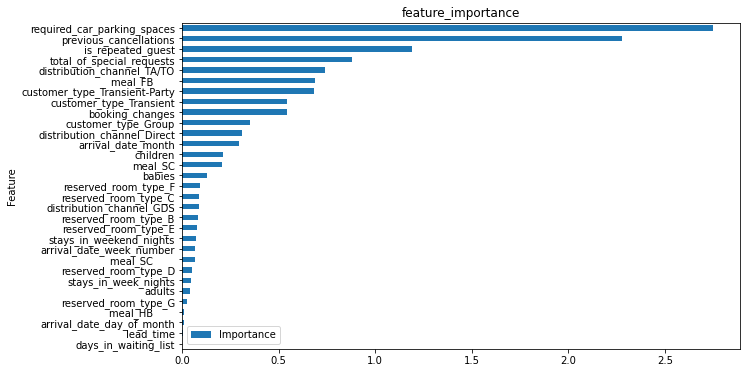

In [51]:
coefficients = lr_best_model.coef_[0]

feature_importance = pd.DataFrame({'Feature': features_train.columns, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))
plt.title('feature_importance')
plt.show()

In [52]:
pip install shap -q

Note: you may need to restart the kernel to use updated packages.


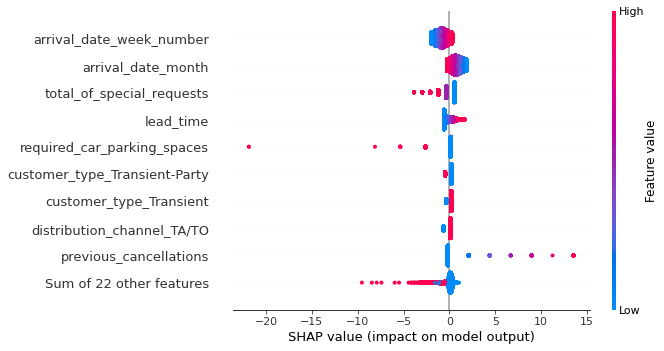

In [53]:
import shap

explainer = shap.Explainer(lr_best_model, features_train)
shap_values = explainer(features_test)
shap.plots.beeswarm(shap_values)

In [54]:
# Рассмотрение первой фичи
shap.plots.force(shap_values[0])

### Шаг 6. Напишите общий вывод

- Логистическая регрессия:
    - Средняя оценка качества модели на обучающей выборке: 0.47
    - Лучшее количество итераций: 13
    - Положительная доля модели: 0.5924139078356346
    - Точность лучшей модели: 0.7787862219792236
    - Доля правильных ответов: 0.787677114641477
    - F1-мера: 0.6729342844994567
    
    
- Прибыль до внедрения депозитов:  48874380.0.0 руб.
- Прогнозируемая прибыль после внедрения депозитов: 60296064.0.0 руб.
- Разность прибылей после и до внедрения:  11421684 руб.


**Прибыль увеличится практически на 25%**


- тип ненадежного клиента
    - большое количество дней между датой бронирования и датой прибытия;
    - у клиента ранее уже были отмены;
    - большое количество изменений параметров заказа;
    - большое количество специальных отметок;
    
    
- Модель логистическая регрессия показала хорошие характеристики, а тем самым хорошую оценочную прибыльность и окупаемость самой модели.

- Если не использовать модель предсказания отказа от бронирования и не тратить на неё сил и средств, можно порекомендовать использовать депозиты для клиентов, которые бронируют номера задолго до заезда, ранее уже были отмены, большое количество изменений параметров заказа, и большое количество специальных отметок. Но модель быстра окупаемая и принесет за год прибыль на 25% раза больше, чем без нее.
